# Mollow triplets

Test out the Fock hierarchy to compare with the squeezed hierarchy.

In [1]:
from functools import partial
import pdb

import pickle
import numpy as np
from scipy.optimize import minimize
from scipy.fftpack import fft
from scipy.integrate import quad
from scipy.special import factorial
import matplotlib.pyplot as plt

import seaborn as sns

import pysme.integrate as integ
import pysme.hierarchy as hier

In [2]:
%matplotlib inline
%config InlineBackend.figure_format = 'svg'

In [3]:
# define Qubit operators
sx = np.array([[0, 1], [1, 0]], dtype=np.complex)
sy = np.array([[0, -1.j], [1.j, 0]], dtype=np.complex)
sz = np.array([[1, 0], [0, -1]], dtype=np.complex)
Id = np.eye(2, dtype=np.complex)
sp = (sx + 1.j * sy) / 2
sm = (sx - 1.j * sy) / 2
zero = np.zeros((2, 2), dtype=np.complex)

In [4]:
plt.style.use('../paper.mplstyle')

A coherent drive adds a Hamiltonian term.
\begin{align}
    d\rho&=dt[\beta^*L-\beta L^\dagger,\rho]+dt\mathcal{D}[L]\rho \\
    &=-idt[i\beta^*L-i\beta L^\dagger,\rho]+dt\mathcal{D}[L]\rho \\
    H_{\text{eff}}&=i\beta^*L-i\beta L^\dagger
\end{align}
Rabi frequency $\Omega=2|\beta|$. Carmichæl notates the Rabi frequency as $2\Omega$, so $\Omega=|\beta|$.

In [5]:
def rect(x, a, b):
    return np.where(x < a, 0, np.where(x < b, 1, 0))

In [6]:
def xi_rect(t, a, b):
    return rect(t, a, b)/np.sqrt(b - a)

In [7]:
quad(lambda t: xi_rect(t, a=0, b=2)**2, -1, 3)

In [8]:
def rho_from_ket(ket):
    return np.outer(ket, ket.conj())

def vac_rho(n):
    ket = np.zeros(n + 1, dtype=np.complex)
    ket[0] = 1
    return rho_from_ket(ket)

def make_squeezed_state_vec(r, mu, N, normalized=True):
    r'''Make a truncated squeezed-state vector.

    The squeezed-state vector is :math:`S(r,\mu)|0\rangle`. The truncated
    vector is renormalized by default.

    Parameters
    ----------
    N: positive integer
        The dimension of the truncated Hilbert space, basis {0, ..., N-1}
    r: real number
        Squeezing amplitude
    mu: real number
        Squeezing phase
    normalized: boolean
        Whether or not the truncated vector is renormalized

    Returns
    -------
    numpy.array
        Squeezed-state vector in the truncated Hilbert space, represented in the
        number basis

    '''
    ket = np.zeros(N, dtype=np.complex)
    for n in range(N//2):
        ket[2*n] = (1 / np.sqrt(np.cosh(r))) * ((-0.5 * np.exp(2.j * mu) * np.tanh(r))**n /
                                                factorial(n)) * np.sqrt(factorial(2 * n))
    return ket / np.linalg.norm(ket) if normalized else ket

def sqz_rho(r, mu, n):
    return rho_from_ket(make_squeezed_state_vec(r, mu, n + 1))

def Heff_fn(beta, L):
    return 1.j*np.conj(beta)*L - 1.j*beta*L.conj().T

def calc_hier_state_evo(xi_fn, L, r, mu, beta, gamma, m_max, rho_ss, t, t0=0, timesteps=2**10,
                        solve_ivp_kwargs=None):
    Id_field = np.eye(m_max + 1, dtype=np.complex)
    factory = hier.HierarchyIntegratorFactory(2, m_max)
    integrator = factory.make_uncond_integrator(xi_fn, Id, np.sqrt(gamma) * L, Heff_fn(beta, L), r, mu)
    times = np.linspace(t0, t, timesteps)
    soln_t = integrator.integrate(rho_ss, times)
    return soln_t

def calc_hier_auto_corr(xi_fn, L, r, mu, beta, gamma, m_max, taus, rho_ss, t, t0=0, timesteps=2**10,
                        solve_ivp_kwargs=None):
    sp_ss = np.trace(sp @ rho_ss)
    sm_ss = np.trace(sm @ rho_ss)
    Id_field = np.eye(m_max + 1, dtype=np.complex)
    factory = hier.HierarchyIntegratorFactory(2, m_max)
    integrator = factory.make_uncond_integrator(xi_fn, Id, np.sqrt(gamma) * L, Heff_fn(beta, L), r, mu)
    times = np.linspace(t0, t, timesteps)
    soln_t = integrator.integrate(rho_ss, times)
    sp_ss_t = soln_t.get_expectations(sp, vac_rho(m_max), idx_slice=np.s_[-1], hermitian=False)
    rho_ss_t = soln_t.get_hierarchy_density_matrices(np.s_[-1])
    L_t_t = rho_ss_t @ np.kron(sp, Id_field)
    L_t_taus = integrator.integrate_hier_init_cond(L_t_t, taus + t,
                                                   solve_ivp_kwargs=solve_ivp_kwargs)
    Expt_t_taus = L_t_taus.get_expectations(sm, vac_rho(m_max), hermitian=False)
    soln_t_taus = integrator.integrate_hier_init_cond(rho_ss_t, taus + t,
                                                      solve_ivp_kwargs=solve_ivp_kwargs)
    sm_ss_t_taus = soln_t_taus.get_expectations(sm, vac_rho(m_max), hermitian=False)
    # Subtract off a bunch of stuff that gets rid of the delta
    return (Expt_t_taus - sp_ss_t * sm_ss - sp_ss * sm_ss_t_taus + sp_ss * sm_ss,
            sp_ss, sm_ss, sp_ss_t, sm_ss_t_taus)

def calc_white_auto_corr(L, gamma, beta, r, mu, times_ss, taus, solve_ivp_kwargs=None):
    N = np.sinh(r)**2
    M_sq = -np.exp(2.j * mu) * np.sinh(r) * np.cosh(r)
    integrator = integ.UncondGaussIntegrator(np.sqrt(gamma)*L, M_sq, N, Heff_fn(beta, L))
    soln_ss = integrator.integrate(Id/2, times_ss)

    #pdb.set_trace()

    rho_ss = soln_ss.get_density_matrices(np.s_[-1])
    sp_ss = np.trace(sp @ rho_ss)
    sm_ss = np.trace(sm @ rho_ss)

    #pdb.set_trace()

    L_0_taus = integrator.integrate_non_herm(rho_ss @ sp, taus, solve_ivp_kwargs=solve_ivp_kwargs)

    #pdb.set_trace()

    Expt_t_taus = L_0_taus.get_expectations(sm, hermitian=False)

    #pdb.set_trace()
    return rho_ss, Expt_t_taus - sp_ss * sm_ss

def calc_quasi_markoff_degen_PA_auto_corr(
        gamma, Omega, omega_A, omega_L, gamma_c, eps, phi_L, phi_s, times_ss, taus, solve_ivp_kwargs=None):
    N_A, N_Om, M_A, M_Om, Delta_AL, F_A, G_A = get_degen_PA_params(
        Omega, omega_A, omega_L, gamma_c, eps, phi_L, phi_s)
    integrator = integ.QuasiMarkoff2LvlIntegrator(
        gamma, N_A, N_Om, M_A, M_Om, Delta_AL, Omega, phi_L, F_A, G_A)
    soln_ss = integrator.integrate(Id/2, times_ss)

    rho_ss = soln_ss.get_density_matrices(np.s_[-1])
    sp_ss = np.trace(sp @ rho_ss)
    sm_ss = np.trace(sm @ rho_ss)

    L_0_taus = integrator.integrate_non_herm(rho_ss @ sp, taus, solve_ivp_kwargs=solve_ivp_kwargs)

    Expt_t_taus = L_0_taus.get_expectations(sm, hermitian=False)
    return rho_ss, Expt_t_taus - sp_ss * sm_ss

In [9]:
def calc_hier_auto_corr_fock(xi_fn, L, r, mu, beta, gamma, m_max, taus, rho_ss, t, t0=0, timesteps=2**10,
                             solve_ivp_kwargs=None):
    sp_ss = np.trace(sp @ rho_ss)
    sm_ss = np.trace(sm @ rho_ss)
    Id_field = np.eye(m_max + 1, dtype=np.complex)
    factory = hier.HierarchyIntegratorFactory(2, m_max)
    integrator = factory.make_uncond_integrator(xi_fn, Id, np.sqrt(gamma) * L, Heff_fn(beta, L), 0, 0)
    times = np.linspace(t0, t, timesteps)
    soln_t = integrator.integrate(rho_ss, times)
    sp_ss_t = soln_t.get_expectations(sp, sqz_rho(r, mu, m_max), idx_slice=np.s_[-1], hermitian=False)
    rho_ss_t = soln_t.get_hierarchy_density_matrices(np.s_[-1])
    L_t_t = rho_ss_t @ np.kron(sp, Id_field)
    L_t_taus = integrator.integrate_hier_init_cond(L_t_t, taus + t,
                                                   solve_ivp_kwargs=solve_ivp_kwargs)
    Expt_t_taus = L_t_taus.get_expectations(sm, sqz_rho(r, mu, m_max), hermitian=False)
    soln_t_taus = integrator.integrate_hier_init_cond(rho_ss_t, taus + t,
                                                      solve_ivp_kwargs=solve_ivp_kwargs)
    sm_ss_t_taus = soln_t_taus.get_expectations(sm, sqz_rho(r, mu, m_max), hermitian=False)
    # Subtract off a bunch of stuff that gets rid of the delta
    return (Expt_t_taus - sp_ss_t * sm_ss - sp_ss * sm_ss_t_taus + sp_ss * sm_ss,
            sp_ss, sm_ss, sp_ss_t, sm_ss_t_taus)

In [10]:
def plot_emission_spectra(auto_corrs, labels, Rabi_offset, kwargs_plots=None, width=50, ax=None, figsize=(10,3), broadband=True):
    if ax is None:
        fig, ax = plt.subplots(figsize=figsize)
        return_fig = True
    else:
        return_fig = False
    if kwargs_plots is None:
        kwargs_plots = it.repeat({}, len(auto_corrs))
    for auto_corr, label, kwargs in zip(auto_corrs, labels, kwargs_plots):
        ywf = fft(auto_corr.real)
        ax.plot(np.abs(np.hstack([ywf[-width:], ywf[:width]])), label=label, **kwargs)
    ax.legend()
    ax.set_xticks([width - Rabi_offset, width, width + Rabi_offset])
    ax.set_xticklabels([r'$\omega_c-\Omega$', r'$\omega_c$', r'$\omega_c+\Omega$'])
    ax.set_yticks([])
    ax.set_ylim(0, None)
    ax.set_ylabel(r'$S(\omega)$')
    ax.set_xlabel(r'$\omega$')
    return (fig, ax) if return_fig else None

In [11]:
def lam_mu(gamma_c, eps):
    lam = gamma_c + eps
    mu = gamma_c - eps
    return lam, mu

def N_degen_PA(omega, omega_A, lam, mu):
    return (lam**2 - mu**2)/4*(1/((omega - omega_A)**2 + mu**2)
                               - 1/((omega - omega_A)**2 + lam**2))
    
def mod_M_degen_PA(omega, omega_A, lam, mu):
    return (lam**2 - mu**2)/4*(1/((omega - omega_A)**2 + mu**2)
                               + 1/((omega - omega_A)**2 + lam**2))

def deltas_degen_PA(gamma_c, Omega, lam, mu):
    delta_mu = gamma_c*Omega*(lam**2 - mu**2)/(4*mu*(Omega**2 + mu**2))
    delta_lam = gamma_c*Omega*(lam**2 - mu**2)/(4*lam*(Omega**2 + mu**2))
    return delta_mu, delta_lam

def F_G(delta_mu, delta_lam, Phi):
    F_A = -(1j/4)*(delta_mu*(1 + np.cos(Phi))
                   - delta_lam*(1 - np.cos(Phi)))
    G_A = -(1/4)*(delta_mu + delta_lam)*np.sin(Phi)
    return F_A, G_A

def get_degen_PA_params(Omega, omega_A, omega_L, gamma_c, eps, phi_L, phi_s):
    lam, mu = lam_mu(gamma_c, eps)
    N_A = N_degen_PA(omega_A, omega_A, lam, mu)
    N_Om = N_degen_PA(omega_A + Omega, omega_A, lam, mu)
    mod_M_A = mod_M_degen_PA(omega_A, omega_A, lam, mu)
    mod_M_Om = mod_M_degen_PA(omega_A + Omega, omega_A, lam, mu)
    M_A = np.exp(2j*phi_s)*mod_M_A
    M_Om = np.exp(2j*phi_s)*mod_M_Om
    Delta_AL = omega_A - omega_L
    Phi = 2*phi_L - phi_s
    delta_mu, delta_lam = deltas_degen_PA(gamma_c, Omega, lam, mu)
    F_A, G_A = F_G(delta_mu, delta_lam, Phi)
    return N_A, N_Om, M_A, M_Om, Delta_AL, F_A, G_A

In [12]:
rho0 = (Id - sz) / 2
S = Id
L = sm
H = zero

In [13]:
gamma = 0.5
beta = 4.j
T = 2**10
width = 2*T
taus = np.linspace(0, T, 2**14)
times_ss = np.linspace(0, 32, 2**12)
d_omega = 2*np.pi / T
Rabi_offset = 2*np.abs(beta) // d_omega

In [14]:
rho_ss_coh, delta_Expt_t_taus_coh = calc_white_auto_corr(L, gamma, beta, 0, 0, times_ss, taus,
                                                         solve_ivp_kwargs={'rtol': 1e-6, 'atol': 1e-9})

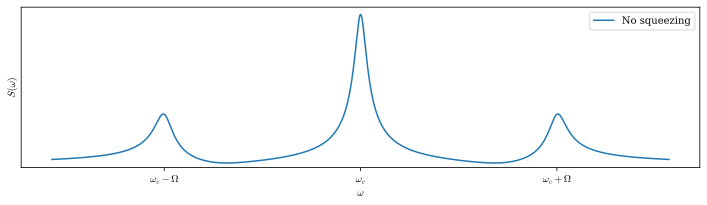

In [15]:
fig, ax = plot_emission_spectra([delta_Expt_t_taus_coh], ['No squeezing'], Rabi_offset, width=width)
plt.tight_layout()

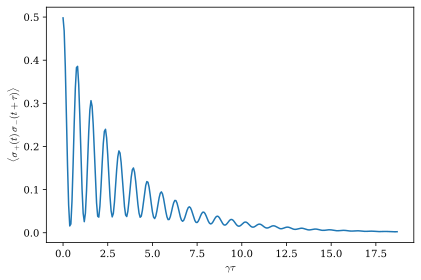

In [16]:
fig, ax = plt.subplots()
times = np.linspace(0, T, len(delta_Expt_t_taus_coh))
tf_idx = 300
ax.plot(times[:tf_idx], delta_Expt_t_taus_coh[:tf_idx].real)
ax.set_xlabel(r'$\gamma\tau$')
ax.set_ylabel(r'$\langle\sigma_+\!(t)\,\sigma_-\!(t+\tau)\rangle$')
plt.tight_layout()

In [17]:
r = np.log(2)
mu = 0
rho_ss_sq, delta_Expt_t_taus_sq = calc_white_auto_corr(L, gamma, beta, r, mu, times_ss, taus,
                                                       solve_ivp_kwargs={'rtol': 1e-6, 'atol': 1e-9})

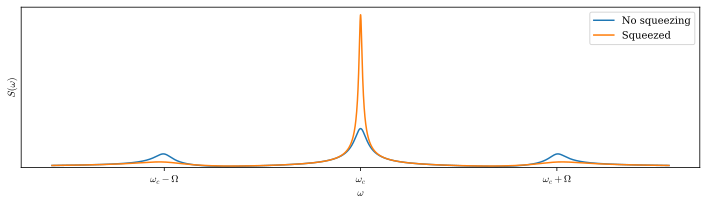

In [18]:
fig, ax = plot_emission_spectra([delta_Expt_t_taus_coh, delta_Expt_t_taus_sq], ['No squeezing', 'Squeezed'], Rabi_offset, width=width)
plt.tight_layout()

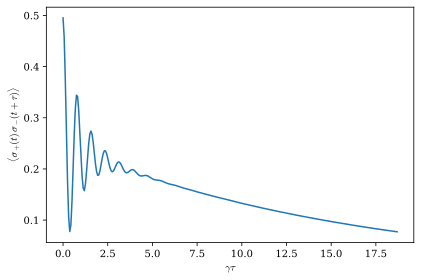

In [19]:
fig, ax = plt.subplots()
times = np.linspace(0, T, len(delta_Expt_t_taus_sq))
tf_idx = 300
ax.plot(times[:tf_idx], delta_Expt_t_taus_sq[:tf_idx].real)
ax.set_xlabel(r'$\gamma\tau$')
ax.set_ylabel(r'$\langle\sigma_+\!(t)\,\sigma_-\!(t+\tau)\rangle$')
plt.tight_layout()

In [20]:
r = np.log(2)
mu = np.pi/2
rho_ss_antisq, delta_Expt_t_taus_antisq = calc_white_auto_corr(L, gamma, beta, r, mu, times_ss, taus,
                                                               solve_ivp_kwargs={'rtol': 1e-6, 'atol': 1e-9})

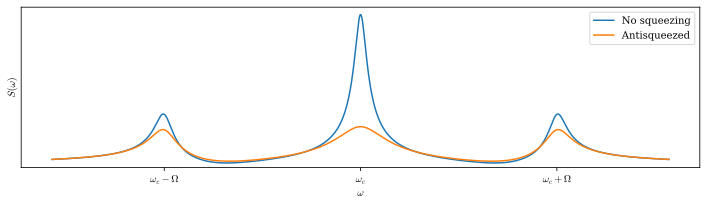

In [21]:
fig, ax = plot_emission_spectra([delta_Expt_t_taus_coh, delta_Expt_t_taus_antisq], ['No squeezing', 'Antisqueezed'], Rabi_offset, width=width)
plt.tight_layout()

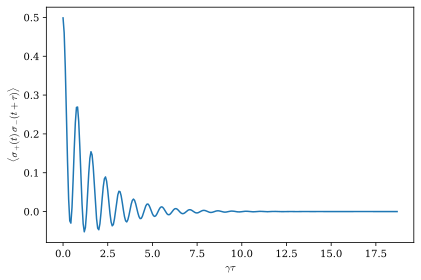

In [22]:
fig, ax = plt.subplots()
times = np.linspace(0, T, len(delta_Expt_t_taus_antisq))
tf_idx = 300
ax.plot(times[:tf_idx], delta_Expt_t_taus_antisq[:tf_idx].real)
ax.set_xlabel(r'$\gamma\tau$')
ax.set_ylabel(r'$\langle\sigma_+\!(t)\,\sigma_-\!(t+\tau)\rangle$')
plt.tight_layout()

In [23]:
Omega = 2*np.abs(beta)
phi_L = np.angle(beta)
omega_A = 0
omega_L = 0
gamma_c = 1
eps = 0.5
phi_s = 0
rho_ss_qm, delta_Expt_t_taus_qm = calc_quasi_markoff_degen_PA_auto_corr(
        gamma, Omega, omega_A, omega_L, gamma_c, eps, phi_L, phi_s, times_ss, taus,
        solve_ivp_kwargs={'rtol': 1e-6, 'atol': 1e-9})

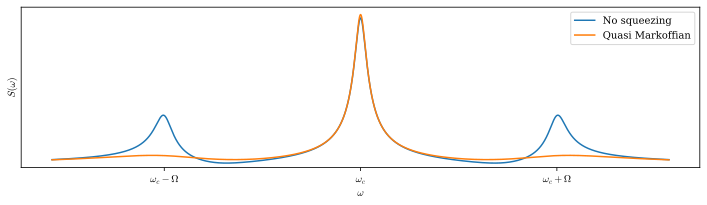

In [24]:
fig, ax = plot_emission_spectra([delta_Expt_t_taus_coh, delta_Expt_t_taus_qm], ['No squeezing', 'Quasi Markoffian'], Rabi_offset, width=width)
plt.tight_layout()

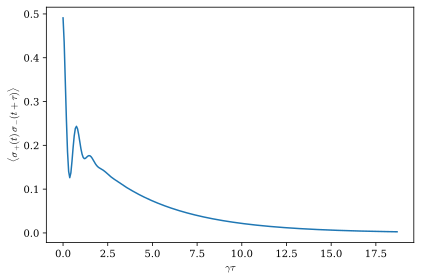

In [25]:
fig, ax = plt.subplots()
times = np.linspace(0, T, len(delta_Expt_t_taus_qm))
tf_idx = 300
ax.plot(times[:tf_idx], delta_Expt_t_taus_qm[:tf_idx].real)
ax.set_xlabel(r'$\gamma\tau$')
ax.set_ylabel(r'$\langle\sigma_+\!(t)\,\sigma_-\!(t+\tau)\rangle$')
plt.tight_layout()

In [26]:
Omega = 2*np.abs(beta)
phi_L = np.angle(beta)
omega_A = 0
omega_L = 0
gamma_c = 1
eps = 0.5
phi_s = np.pi/2
rho_ss_qm_anti, delta_Expt_t_taus_qm_anti = calc_quasi_markoff_degen_PA_auto_corr(
        gamma, Omega, omega_A, omega_L, gamma_c, eps, phi_L, phi_s, times_ss, taus,
        solve_ivp_kwargs={'rtol': 1e-6, 'atol': 1e-9})

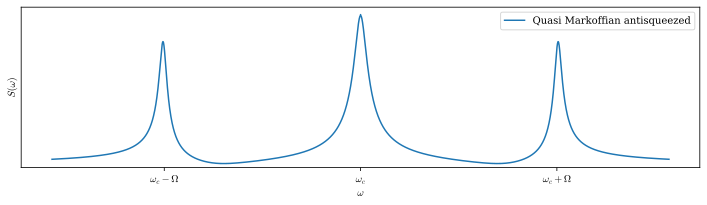

In [27]:
fig, ax = plot_emission_spectra([delta_Expt_t_taus_qm_anti], ['Quasi Markoffian antisqueezed'], Rabi_offset, width=width)
plt.tight_layout()

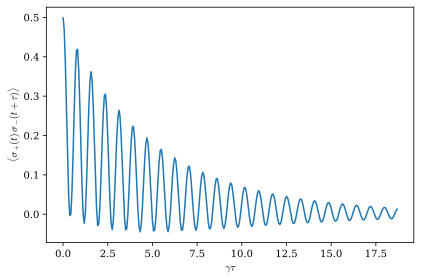

In [28]:
fig, ax = plt.subplots()
times = np.linspace(0, T, len(delta_Expt_t_taus_qm_anti))
tf_idx = 300
ax.plot(times[:tf_idx], delta_Expt_t_taus_qm_anti[:tf_idx].real)
ax.set_xlabel(r'$\gamma\tau$')
ax.set_ylabel(r'$\langle\sigma_+\!(t)\,\sigma_-\!(t+\tau)\rangle$')
plt.tight_layout()

In [29]:
def gen_save_load_data(data_gen_method, fname, overwrite=False):
    '''Get the data returned by the generating method, running the method only if the data isn't already available.

    If the given filename exists, load and return the data from that file. Otherwise generate the data using the
    supplied method and save and return it.

    Useful for notebooks you imagine running multiple times, but where some of the data is expensive to generate
    and you want to save it to disk to be reloaded for future sessions.

    '''
    try:
        with open(fname, 'xb' if not overwrite else 'wb') as f:
            data = data_gen_method()
            pickle.dump(data, f)
    except FileExistsError:
        print('Data already exist.')
        with open(fname, 'rb') as f:
            data = pickle.load(f)
    return data

In [30]:
def gen_Expt_t_taus_wavepacket(L, r, mu, beta, gamma, m_max, taus, rho_ss_coh, t_final, solve_ivp_kwargs=None):
    '''Generate autocorrelation function for squeezed hierarchy

    Squeezing is in a square wavepacket with duration 2/Gamma and peaked in frequency at the Rabi sideband.

    '''
    return calc_hier_auto_corr(lambda t: xi_rect(t, 0, 2)*np.exp(2.j*np.abs(beta)*t),
                               L, r, mu, beta, gamma, m_max,
                               taus, rho_ss_coh, t=t_final,
                               solve_ivp_kwargs=solve_ivp_kwargs)

In [31]:
r = np.log(2)
mu = 0
m_max = 12
t_final = 0.5
Expt_t_taus_wavepacket = gen_save_load_data(partial(gen_Expt_t_taus_wavepacket, L=L, r=r, mu=mu, beta=beta,
                                                    gamma=gamma, m_max=m_max, taus=taus, rho_ss_coh=rho_ss_coh,
                                                    t_final=t_final, solve_ivp_kwargs={'rtol': 1e-6, 'atol': 1e-9}),
                                            'Expt_t_taus_wavepacket.pickle')

Data already exist.


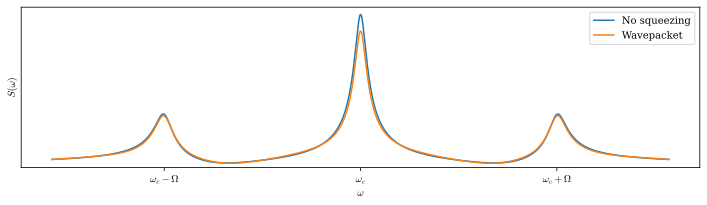

In [32]:
fig, ax = plot_emission_spectra([delta_Expt_t_taus_coh,
                                 Expt_t_taus_wavepacket[0]],
                                ['No squeezing',
                                 'Wavepacket'],
                                Rabi_offset, width=width)
plt.tight_layout()

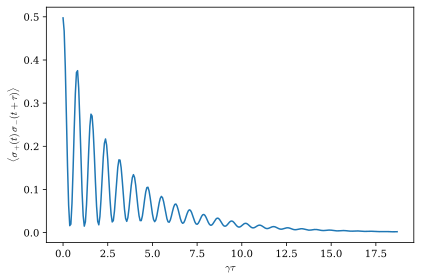

In [33]:
fig, ax = plt.subplots()
times = np.linspace(0, T, len(Expt_t_taus_wavepacket[0]))
tf_idx = 300
ax.plot(times[:tf_idx], Expt_t_taus_wavepacket[0][:tf_idx].real)
ax.set_xlabel(r'$\gamma\tau$')
ax.set_ylabel(r'$\langle\sigma_+\!(t)\,\sigma_-\!(t+\tau)\rangle$')
plt.tight_layout()

In [127]:
def gen_Expt_t_taus_wavepacket_fock(L, r, mu, beta, gamma, m_max, taus, rho_ss_coh, t_final, solve_ivp_kwargs=None):
    '''Generate autocorrelation function for squeezed wave packet in the fock hierarchy

    Squeezing is in a square wavepacket with duration 2/Gamma and peaked in frequency at the Rabi sideband.

    '''
    return calc_hier_auto_corr_fock(lambda t: xi_rect(t, 0, 2)*np.exp(2.j*np.abs(beta)*t),
                                    L, r, mu, beta, gamma, m_max,
                                    taus, rho_ss_coh, t=t_final,
                                    solve_ivp_kwargs=solve_ivp_kwargs)

In [35]:
r = np.log(2)
mu = 0
m_max = 12
t_final = 0.5
Expt_t_taus_wavepacket_fock = gen_save_load_data(partial(gen_Expt_t_taus_wavepacket_fock, L=L, r=r, mu=mu, beta=beta,
                                                         gamma=gamma, m_max=m_max, taus=taus, rho_ss_coh=rho_ss_coh,
                                                         t_final=t_final, solve_ivp_kwargs={'rtol': 1e-6, 'atol': 1e-9}),
                                                 'Expt_t_taus_wavepacket_fock.pickle')

Data already exist.


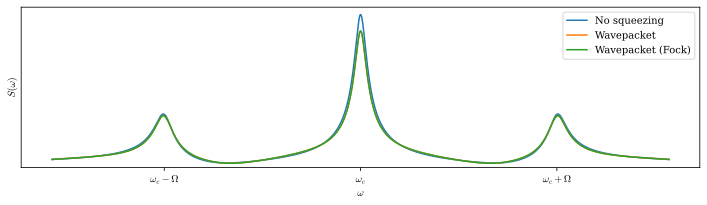

In [36]:
fig, ax = plot_emission_spectra([delta_Expt_t_taus_coh,
                                 Expt_t_taus_wavepacket[0],
                                 Expt_t_taus_wavepacket_fock[0]],
                                ['No squeezing',
                                 'Wavepacket',
                                 'Wavepacket (Fock)'],
                                Rabi_offset, width=width)
plt.tight_layout()

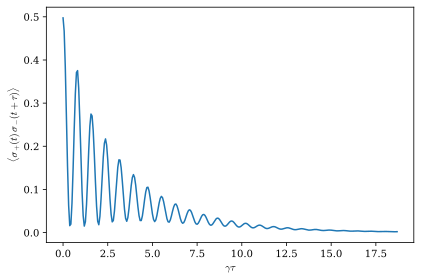

In [37]:
fig, ax = plt.subplots()
times = np.linspace(0, T, len(Expt_t_taus_wavepacket_fock[0]))
tf_idx = 300
ax.plot(times[:tf_idx], Expt_t_taus_wavepacket_fock[0][:tf_idx].real)
ax.set_xlabel(r'$\gamma\tau$')
ax.set_ylabel(r'$\langle\sigma_+\!(t)\,\sigma_-\!(t+\tau)\rangle$')
plt.tight_layout()

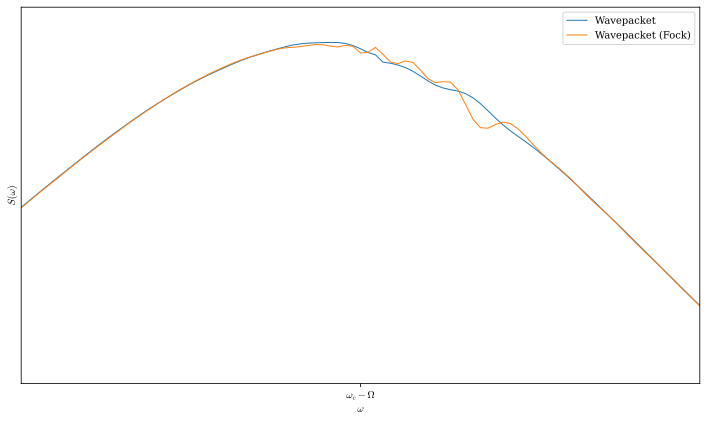

In [38]:
fig, ax = plot_emission_spectra([Expt_t_taus_wavepacket[0],
                                 Expt_t_taus_wavepacket_fock[0]],
                                ['Wavepacket',
                                 'Wavepacket (Fock)'],
                                Rabi_offset, width=width,
                                kwargs_plots=it.repeat({'linewidth': 1}),
                                figsize=(10, 6))
ax.set_xlim(width - Rabi_offset - np.sqrt(width), width - Rabi_offset + np.sqrt(width))
ax.set_ylim(ax.get_ylim()[1]/4, 3*ax.get_ylim()[1]/8)
plt.tight_layout()

## Investigate the convergence issues

In [39]:
r = np.log(2)
mu = 0
m_max = 12
t_final = 0.75
Expt_t_taus_wavepacket_075 = gen_save_load_data(partial(gen_Expt_t_taus_wavepacket, L=L, r=r, mu=mu, beta=beta,
                                                        gamma=gamma, m_max=m_max, taus=taus, rho_ss_coh=rho_ss_coh,
                                                        t_final=t_final, solve_ivp_kwargs={'rtol': 1e-6, 'atol': 1e-9}),
                                                'Expt_t_taus_wavepacket_075.pickle')

Data already exist.


In [40]:
r = np.log(2)
mu = 0
m_max = 12
t_final = 0.25
Expt_t_taus_wavepacket_025 = gen_save_load_data(partial(gen_Expt_t_taus_wavepacket, L=L, r=r, mu=mu, beta=beta,
                                                        gamma=gamma, m_max=m_max, taus=taus, rho_ss_coh=rho_ss_coh,
                                                        t_final=t_final, solve_ivp_kwargs={'rtol': 1e-6, 'atol': 1e-9}),
                                                'Expt_t_taus_wavepacket_025.pickle')

Data already exist.


In [41]:
r = np.log(2)
mu = 0
m_max = 12
t_final = 1.0
Expt_t_taus_wavepacket_100 = gen_save_load_data(partial(gen_Expt_t_taus_wavepacket, L=L, r=r, mu=mu, beta=beta,
                                                        gamma=gamma, m_max=m_max, taus=taus, rho_ss_coh=rho_ss_coh,
                                                        t_final=t_final, solve_ivp_kwargs={'rtol': 1e-6, 'atol': 1e-9}),
                                                'Expt_t_taus_wavepacket_100.pickle')

Data already exist.


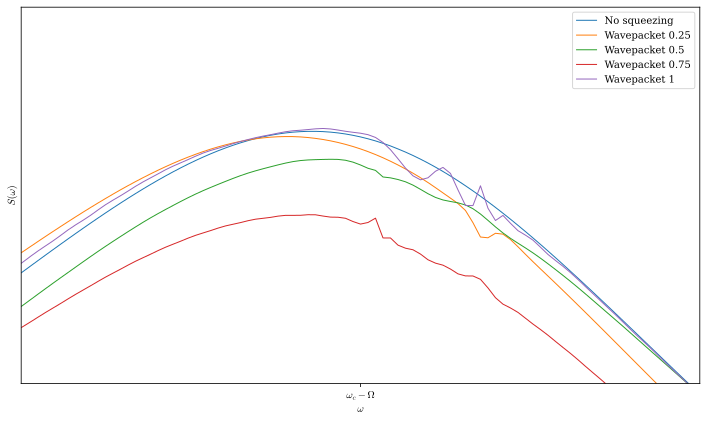

In [42]:
fig, ax = plot_emission_spectra([delta_Expt_t_taus_coh,
                                 Expt_t_taus_wavepacket_025[0],
                                 Expt_t_taus_wavepacket[0],
                                 Expt_t_taus_wavepacket_075[0],
                                 Expt_t_taus_wavepacket_100[0]],
                                ['No squeezing',
                                 'Wavepacket 0.25',
                                 'Wavepacket 0.5',
                                 'Wavepacket 0.75',
                                 'Wavepacket 1'],
                                Rabi_offset, width=width,
                                kwargs_plots=it.repeat({'linewidth': 1}),
                                figsize=(10, 6))
ax.set_xlim(width - Rabi_offset - np.sqrt(width), width - Rabi_offset + np.sqrt(width))
ax.set_ylim(ax.get_ylim()[1]/4, 3*ax.get_ylim()[1]/8)
plt.tight_layout()

In [43]:
r = np.log(2)
mu = 0
m_max = 12
t_final = 1.0
solve_ivp_kwargs = {'rtol': 1e-9, 'atol': 1e-12}
Expt_t_taus_wavepacket_100_tol = gen_save_load_data(partial(gen_Expt_t_taus_wavepacket, L=L, r=r, mu=mu, beta=beta,
                                                            gamma=gamma, m_max=m_max, taus=taus, rho_ss_coh=rho_ss_coh,
                                                            t_final=t_final, solve_ivp_kwargs=solve_ivp_kwargs),
                                                    'Expt_t_taus_wavepacket_100_tol.pickle')

Data already exist.


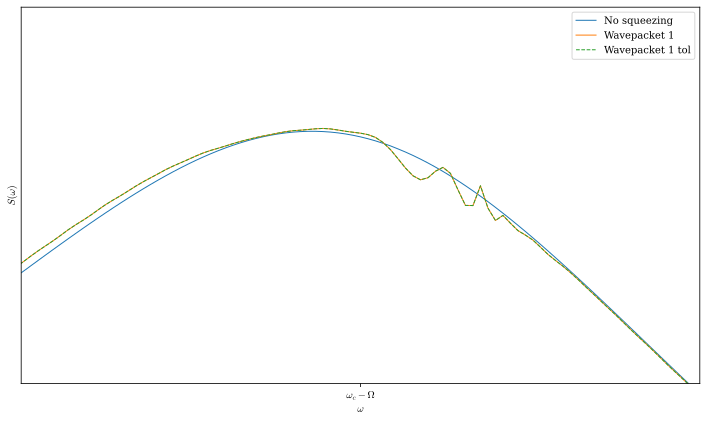

In [44]:
fig, ax = plot_emission_spectra([delta_Expt_t_taus_coh,
                                 Expt_t_taus_wavepacket_100[0],
                                 Expt_t_taus_wavepacket_100_tol[0]],
                                ['No squeezing',
                                 'Wavepacket 1',
                                 'Wavepacket 1 tol'],
                                Rabi_offset, width=width,
                                kwargs_plots=[{'linewidth': 1}, {'linewidth': 1},
                                              {'linewidth': 1, 'linestyle': '--'}],
                                figsize=(10, 6))
ax.set_xlim(width - Rabi_offset - np.sqrt(width), width - Rabi_offset + np.sqrt(width))
ax.set_ylim(ax.get_ylim()[1]/4, 3*ax.get_ylim()[1]/8)
plt.tight_layout()

In [45]:
r = np.log(2)
mu = 0
m_max = 13
t_final = 1.0
solve_ivp_kwargs = {'rtol': 1e-6, 'atol': 1e-9}
Expt_t_taus_wavepacket_100_m_13 = gen_save_load_data(partial(gen_Expt_t_taus_wavepacket, L=L, r=r, mu=mu, beta=beta,
                                                             gamma=gamma, m_max=m_max, taus=taus, rho_ss_coh=rho_ss_coh,
                                                             t_final=t_final, solve_ivp_kwargs=solve_ivp_kwargs),
                                                     'Expt_t_taus_wavepacket_100_m_13.pickle')

Data already exist.


In [46]:
r = np.log(2)
mu = 0
m_max = 14
t_final = 1.0
solve_ivp_kwargs = {'rtol': 1e-6, 'atol': 1e-9}
Expt_t_taus_wavepacket_100_m_14 = gen_save_load_data(partial(gen_Expt_t_taus_wavepacket, L=L, r=r, mu=mu, beta=beta,
                                                             gamma=gamma, m_max=m_max, taus=taus, rho_ss_coh=rho_ss_coh,
                                                             t_final=t_final, solve_ivp_kwargs=solve_ivp_kwargs),
                                                     'Expt_t_taus_wavepacket_100_m_14.pickle')

Data already exist.


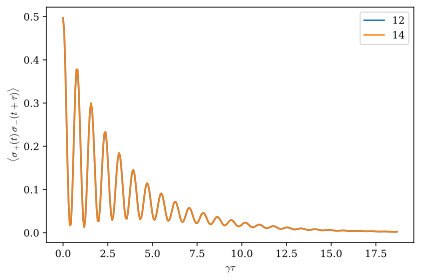

In [47]:
fig, ax = plt.subplots()
times = np.linspace(0, T, len(Expt_t_taus_wavepacket_100_m_14[0]))
tf_idx = 300
ax.plot(times[:tf_idx], Expt_t_taus_wavepacket_100[0][:tf_idx].real, label='12')
ax.plot(times[:tf_idx], Expt_t_taus_wavepacket_100_m_14[0][:tf_idx].real, label='14')
ax.set_xlabel(r'$\gamma\tau$')
ax.set_ylabel(r'$\langle\sigma_+\!(t)\,\sigma_-\!(t+\tau)\rangle$')
ax.legend()
plt.tight_layout()

In [48]:
r = np.log(2)
mu = 0
m_max = 14
t_final = 3
solve_ivp_kwargs = {'rtol': 1e-6, 'atol': 1e-9}
solns_wavepacket_100_m_14 = calc_hier_state_evo(lambda t: xi_rect(t, 0, 2)*np.exp(2.j*np.abs(beta)*t),
                                                L, r, mu, beta, gamma, m_max,
                                                rho_ss_coh, t=t_final,
                                                solve_ivp_kwargs=solve_ivp_kwargs)

In [49]:
r = np.log(2)
mu = 0
m_max = 14
t_final = 3
solve_ivp_kwargs = {'rtol': 1e-6, 'atol': 1e-9, 'method': 'BDF'}
solns_wavepacket_100_m_14_tol = calc_hier_state_evo(lambda t: xi_rect(t, 0, 2)*np.exp(2.j*np.abs(beta)*t),
                                                    L, r, mu, beta, gamma, m_max,
                                                    rho_ss_coh, t=t_final,
                                                    solve_ivp_kwargs=solve_ivp_kwargs)

In [50]:
r = np.log(2)
mu = 0
m_max = 13
t_final = 3
solve_ivp_kwargs = {'rtol': 1e-6, 'atol': 1e-9}
solns_wavepacket_100_m_13 = calc_hier_state_evo(lambda t: xi_rect(t, 0, 2)*np.exp(2.j*np.abs(beta)*t),
                                                L, r, mu, beta, gamma, m_max,
                                                rho_ss_coh, t=t_final,
                                                solve_ivp_kwargs=solve_ivp_kwargs)

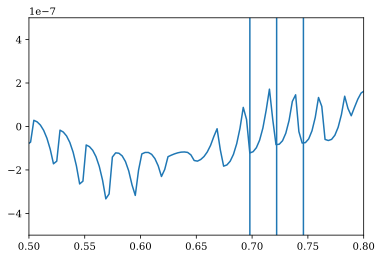

In [51]:
z_vals_13 = solns_wavepacket_100_m_13.get_expectations(sz, rho_from_ket(np.array([1] + 13*[0])))
z_vals_14 = solns_wavepacket_100_m_14.get_expectations(sz, rho_from_ket(np.array([1] + 14*[0])))
times = np.linspace(0, t_final, len(z_vals_13))
plt.plot(times, z_vals_13 - z_vals_14)
plt.xlim(0.5, 0.8)
plt.ylim(-0.0000005, 0.0000005)
w = 0.024
plt.axvline(0.698)
plt.axvline(0.698 + w)
plt.axvline(0.698 + 2*w)

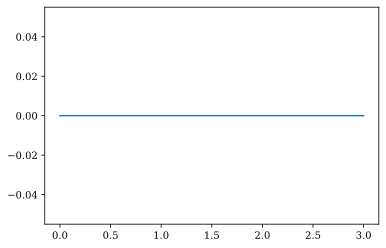

In [52]:
z_vals_14_tol = solns_wavepacket_100_m_14_tol.get_expectations(sz, rho_from_ket(np.array([1] + 14*[0])))
z_vals_14 = solns_wavepacket_100_m_14.get_expectations(sz, rho_from_ket(np.array([1] + 14*[0])))
times = np.linspace(0, t_final, len(z_vals_13))
plt.plot(times, z_vals_14_tol - z_vals_14)
#plt.xlim(0.5, 0.8)
#plt.ylim(-0.0000005, 0.0000005)
#w = 0.024
#plt.axvline(0.698)
#plt.axvline(0.698 + w)
#plt.axvline(0.698 + 2*w)

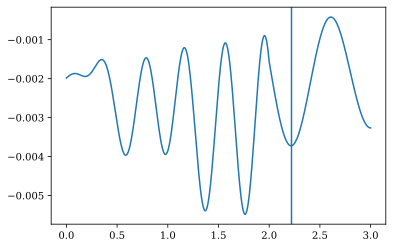

In [53]:
times = np.linspace(0, t_final, len(z_vals_13))
plt.plot(times, z_vals_13)
#plt.xlim(0.5, 0.8)
#plt.ylim(-0.0000005, 0.0000005)
#w = 0.024
plt.axvline(2.22)
#plt.axvline(0.698 + w)
#plt.axvline(0.698 + 2*w)

In [54]:
1/w

In [55]:
1/(3-2.22)

In [56]:
(3-2.22)/w

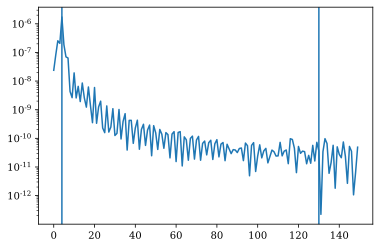

In [57]:
plt.semilogy(np.abs(fft(z_vals_13 - z_vals_14)[:150])**2)
plt.axvline(4)
plt.axvline(4*32.5)

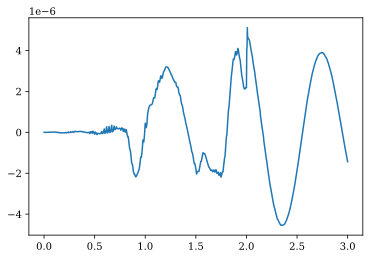

In [58]:
plt.plot(times, solns_wavepacket_100_m_13.get_expectations(sy, rho_from_ket(np.array([1] + 13*[0])))
         - solns_wavepacket_100_m_14.get_expectations(sy, rho_from_ket(np.array([1] + 14*[0]))))

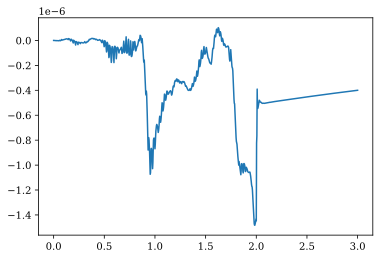

In [59]:
plt.plot(times, solns_wavepacket_100_m_13.get_expectations(sx, rho_from_ket(np.array([1] + 13*[0])))
         - solns_wavepacket_100_m_14.get_expectations(sx, rho_from_ket(np.array([1] + 14*[0]))))

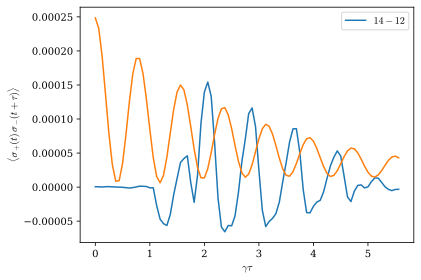

In [60]:
fig, ax = plt.subplots()
times = np.linspace(0, T, len(Expt_t_taus_wavepacket_100_m_14[0]))
tf_idx = 90
ax.plot(times[:tf_idx], Expt_t_taus_wavepacket_100_m_14[0][:tf_idx].real - Expt_t_taus_wavepacket_100[0][:tf_idx].real,
        label='$14-12$')
ax.plot(times[:tf_idx], 5e-4*Expt_t_taus_wavepacket_100_m_14[0][:tf_idx].real)
ax.set_xlabel(r'$\gamma\tau$')
ax.set_ylabel(r'$\langle\sigma_+\!(t)\,\sigma_-\!(t+\tau)\rangle$')
ax.legend()
plt.tight_layout()

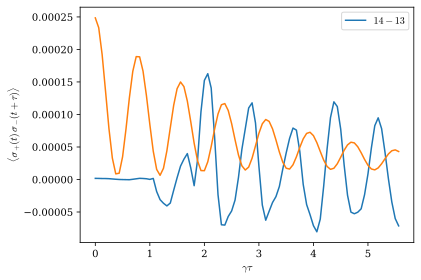

In [61]:
fig, ax = plt.subplots()
times = np.linspace(0, T, len(Expt_t_taus_wavepacket_100_m_14[0]))
tf_idx = 90
ax.plot(times[:tf_idx], Expt_t_taus_wavepacket_100_m_14[0][:tf_idx].real - Expt_t_taus_wavepacket_100_m_13[0][:tf_idx].real,
        label='$14-13$')
ax.plot(times[:tf_idx], 5e-4*Expt_t_taus_wavepacket_100_m_14[0][:tf_idx].real)
ax.set_xlabel(r'$\gamma\tau$')
ax.set_ylabel(r'$\langle\sigma_+\!(t)\,\sigma_-\!(t+\tau)\rangle$')
ax.legend()
plt.tight_layout()

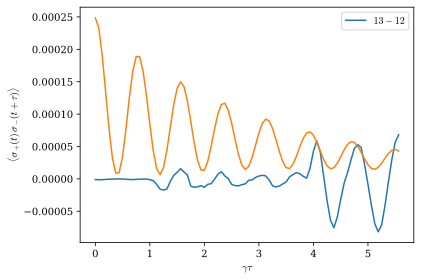

In [62]:
fig, ax = plt.subplots()
times = np.linspace(0, T, len(Expt_t_taus_wavepacket_100_m_14[0]))
tf_idx = 90
ax.plot(times[:tf_idx], Expt_t_taus_wavepacket_100_m_13[0][:tf_idx].real - Expt_t_taus_wavepacket_100[0][:tf_idx].real,
        label='$13-12$')
ax.plot(times[:tf_idx], 5e-4*Expt_t_taus_wavepacket_100_m_14[0][:tf_idx].real)
ax.set_xlabel(r'$\gamma\tau$')
ax.set_ylabel(r'$\langle\sigma_+\!(t)\,\sigma_-\!(t+\tau)\rangle$')
ax.legend()
plt.tight_layout()

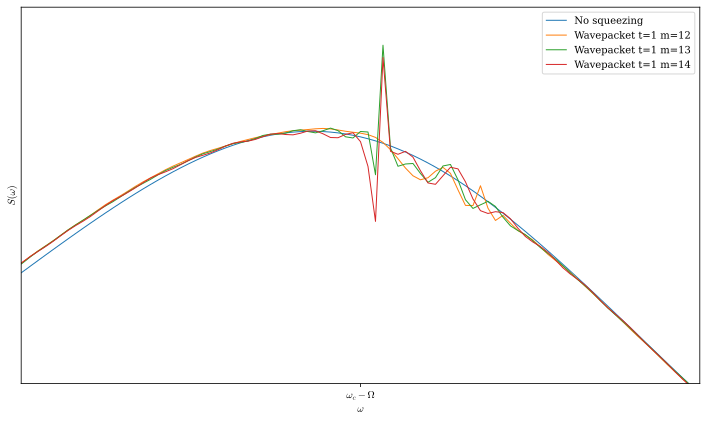

In [63]:
fig, ax = plot_emission_spectra([delta_Expt_t_taus_coh,
                                 Expt_t_taus_wavepacket_100[0],
                                 Expt_t_taus_wavepacket_100_m_13[0],
                                 Expt_t_taus_wavepacket_100_m_14[0]],
                                ['No squeezing',
                                 'Wavepacket t=1 m=12',
                                 'Wavepacket t=1 m=13',
                                 'Wavepacket t=1 m=14'],
                                Rabi_offset, width=width,
                                kwargs_plots=it.repeat({'linewidth': 1}),
                                figsize=(10, 6))
ax.set_xlim(width - Rabi_offset - np.sqrt(width), width - Rabi_offset + np.sqrt(width))
ax.set_ylim(ax.get_ylim()[1]/4, 3*ax.get_ylim()[1]/8)
plt.tight_layout()

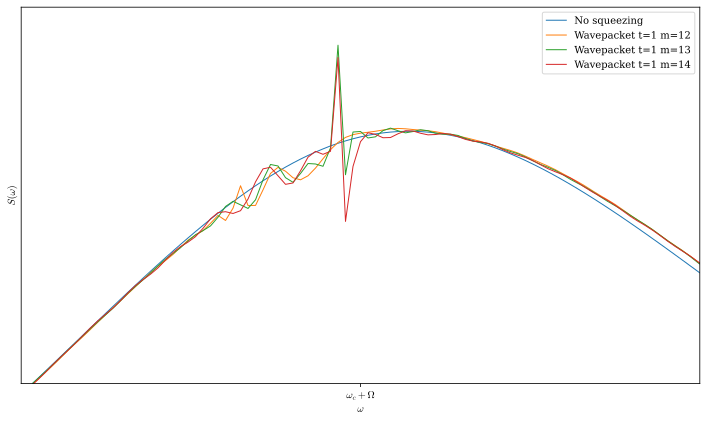

In [64]:
fig, ax = plot_emission_spectra([delta_Expt_t_taus_coh,
                                 Expt_t_taus_wavepacket_100[0],
                                 Expt_t_taus_wavepacket_100_m_13[0],
                                 Expt_t_taus_wavepacket_100_m_14[0]],
                                ['No squeezing',
                                 'Wavepacket t=1 m=12',
                                 'Wavepacket t=1 m=13',
                                 'Wavepacket t=1 m=14'],
                                Rabi_offset, width=width,
                                kwargs_plots=it.repeat({'linewidth': 1}),
                                figsize=(10, 6))
ax.set_xlim(width + Rabi_offset - np.sqrt(width), width + Rabi_offset + np.sqrt(width))
ax.set_ylim(ax.get_ylim()[1]/4, 3*ax.get_ylim()[1]/8)
plt.tight_layout()

In [65]:
r = np.log(2)
mu = 0
m_max = 12
t_final = 1.0
Expt_t_taus_wavepacket_100_fock = gen_save_load_data(partial(gen_Expt_t_taus_wavepacket_fock, L=L, r=r, mu=mu, beta=beta,
                                                             gamma=gamma, m_max=m_max, taus=taus, rho_ss_coh=rho_ss_coh,
                                                             t_final=t_final, solve_ivp_kwargs={'rtol': 1e-6, 'atol': 1e-9}),
                                                     'Expt_t_taus_wavepacket_100_fock.pickle')

Data already exist.


In [66]:
r = np.log(2)
mu = 0
m_max = 14
t_final = 1.0
solve_ivp_kwargs = {'rtol': 1e-6, 'atol': 1e-9}
Expt_t_taus_wavepacket_100_m_14_fock = gen_save_load_data(partial(gen_Expt_t_taus_wavepacket_fock, L=L, r=r, mu=mu, beta=beta,
                                                                  gamma=gamma, m_max=m_max, taus=taus, rho_ss_coh=rho_ss_coh,
                                                                  t_final=t_final, solve_ivp_kwargs=solve_ivp_kwargs),
                                                          'Expt_t_taus_wavepacket_100_m_14_fock.pickle')

Data already exist.


In [67]:
r = np.log(2)
mu = 0
m_max = 16
t_final = 1.0
solve_ivp_kwargs = {'rtol': 1e-6, 'atol': 1e-9}
Expt_t_taus_wavepacket_100_m_16_fock = gen_save_load_data(partial(gen_Expt_t_taus_wavepacket_fock, L=L, r=r, mu=mu, beta=beta,
                                                                  gamma=gamma, m_max=m_max, taus=taus, rho_ss_coh=rho_ss_coh,
                                                                  t_final=t_final, solve_ivp_kwargs=solve_ivp_kwargs),
                                                          'Expt_t_taus_wavepacket_100_m_16_fock.pickle')

Data already exist.


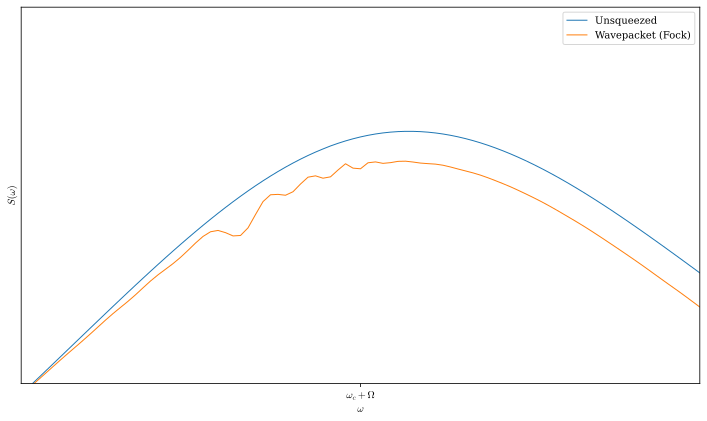

In [68]:
fig, ax = plot_emission_spectra([delta_Expt_t_taus_coh,
                                 Expt_t_taus_wavepacket_fock[0]],
                                ['Unsqueezed',
                                 'Wavepacket (Fock)'],
                                Rabi_offset, width=width,
                                kwargs_plots=it.repeat({'linewidth': 1}),
                                figsize=(10, 6))
ax.set_xlim(width + Rabi_offset - np.sqrt(width), width + Rabi_offset + np.sqrt(width))
ax.set_ylim(ax.get_ylim()[1]/4, 3*ax.get_ylim()[1]/8)
plt.tight_layout()

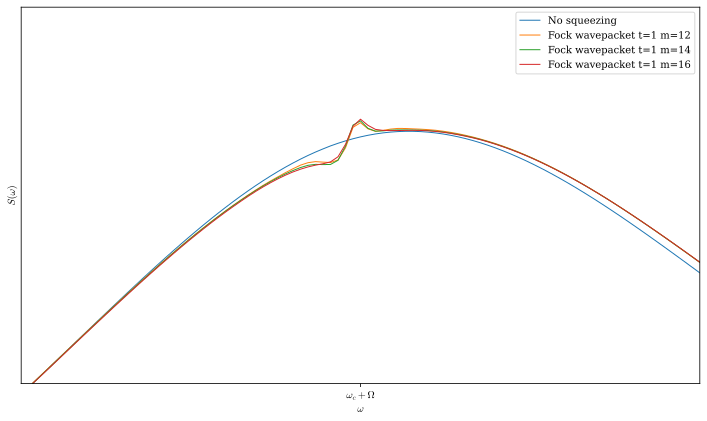

In [69]:
fig, ax = plot_emission_spectra([delta_Expt_t_taus_coh,
                                 Expt_t_taus_wavepacket_100_fock[0],
                                 Expt_t_taus_wavepacket_100_m_14_fock[0],
                                 Expt_t_taus_wavepacket_100_m_16_fock[0]],
                                ['No squeezing',
                                 'Fock wavepacket t=1 m=12',
                                 'Fock wavepacket t=1 m=14',
                                 'Fock wavepacket t=1 m=16'],
                                Rabi_offset, width=width,
                                kwargs_plots=it.repeat({'linewidth': 1}),
                                figsize=(10, 6))
ax.set_xlim(width + Rabi_offset - np.sqrt(width), width + Rabi_offset + np.sqrt(width))
ax.set_ylim(ax.get_ylim()[1]/4, 3*ax.get_ylim()[1]/8)
plt.tight_layout()

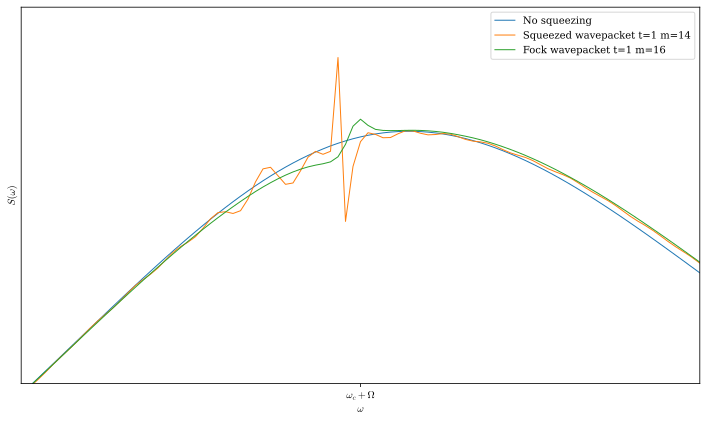

In [70]:
fig, ax = plot_emission_spectra([delta_Expt_t_taus_coh,
                                 Expt_t_taus_wavepacket_100_m_14[0],
                                 Expt_t_taus_wavepacket_100_m_16_fock[0]],
                                ['No squeezing',
                                 'Squeezed wavepacket t=1 m=14',
                                 'Fock wavepacket t=1 m=16'],
                                Rabi_offset, width=width,
                                kwargs_plots=it.repeat({'linewidth': 1}),
                                figsize=(10, 6))
ax.set_xlim(width + Rabi_offset - np.sqrt(width), width + Rabi_offset + np.sqrt(width))
ax.set_ylim(ax.get_ylim()[1]/4, 3*ax.get_ylim()[1]/8)
plt.tight_layout()

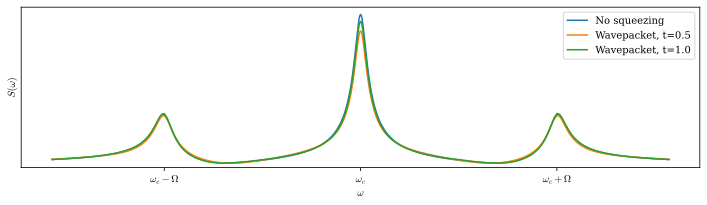

In [71]:
fig, ax = plot_emission_spectra([delta_Expt_t_taus_coh,
                                 Expt_t_taus_wavepacket_fock[0],
                                 Expt_t_taus_wavepacket_100_fock[0]],
                                ['No squeezing',
                                 'Wavepacket, t=0.5',
                                 'Wavepacket, t=1.0'],
                                Rabi_offset, width=width)
plt.tight_layout()

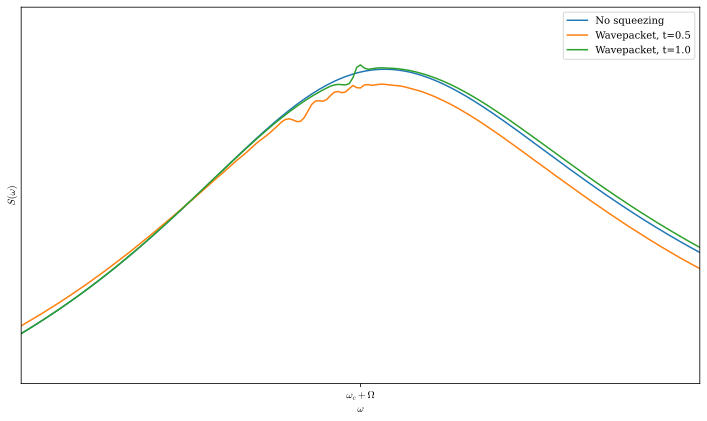

In [72]:
fig, ax = plot_emission_spectra([delta_Expt_t_taus_coh,
                                 Expt_t_taus_wavepacket_fock[0],
                                 Expt_t_taus_wavepacket_100_fock[0]],
                                ['No squeezing',
                                 'Wavepacket, t=0.5',
                                 'Wavepacket, t=1.0'],
                                Rabi_offset, width=width, figsize=(10, 6))
ax.set_xlim(width + Rabi_offset - 2*np.sqrt(width), width + Rabi_offset + 2*np.sqrt(width))
ax.set_ylim(ax.get_ylim()[1]/8, 3*ax.get_ylim()[1]/8)
plt.tight_layout()

In [73]:
1/16

About 34 m per `t_final` value, so I expect 476 m, which is almost 8 h.

In [128]:
gen_Expt_t_taus_wavepacket_fock?

Signature:
gen_Expt_t_taus_wavepacket_fock(
    L,
    r,
    mu,
    beta,
    gamma,
    m_max,
    taus,
    rho_ss_coh,
    t_final,
    solve_ivp_kwargs=None,
)
Docstring:
Generate autocorrelation function for squeezed wave packet in the fock hierarchy

Squeezing is in a square wavepacket with duration 2/Gamma and peaked in frequency at the Rabi sideband.
File:      ~/src/python/pysme/notebooks/mollow-triplets/<ipython-input-127-aec392ffe741>
Type:      function


In [74]:
r = np.log(2)
mu = 0
Expt_t_taus_wp_fock = {}
for t_final in np.arange(1, 16)/16:
    print('t_final: {:.4f}'.format(t_final))
    for m_max in [12, 14, 16]:
        print('m_max: {:d}'.format(m_max))
        Expt_t_taus_wp_fock[t_final,m_max] = gen_save_load_data(partial(gen_Expt_t_taus_wavepacket_fock, L=L, r=r, mu=mu, beta=beta,
                                                                        gamma=gamma, m_max=m_max, taus=taus, rho_ss_coh=rho_ss_coh,
                                                                        t_final=t_final, solve_ivp_kwargs={'rtol': 1e-6, 'atol': 1e-9}),
                                                                'Expt_t_taus_wp_fock_{:.4f}_{:d}.pickle'.format(t_final, m_max))

t_final: 0.0625
m_max: 12
Data already exist.
m_max: 14
Data already exist.
m_max: 16
Data already exist.
t_final: 0.1250
m_max: 12
Data already exist.
m_max: 14
Data already exist.
m_max: 16
Data already exist.
t_final: 0.1875
m_max: 12
Data already exist.
m_max: 14
Data already exist.
m_max: 16
Data already exist.
t_final: 0.2500
m_max: 12
Data already exist.
m_max: 14
Data already exist.
m_max: 16
Data already exist.
t_final: 0.3125
m_max: 12
Data already exist.
m_max: 14
Data already exist.
m_max: 16
Data already exist.
t_final: 0.3750
m_max: 12
Data already exist.
m_max: 14
Data already exist.
m_max: 16
Data already exist.
t_final: 0.4375
m_max: 12
Data already exist.
m_max: 14
Data already exist.
m_max: 16
Data already exist.
t_final: 0.5000
m_max: 12
Data already exist.
m_max: 14
Data already exist.
m_max: 16
Data already exist.
t_final: 0.5625
m_max: 12
Data already exist.
m_max: 14
Data already exist.
m_max: 16
Data already exist.
t_final: 0.6250
m_max: 12
Data already exist.


No handles with labels found to put in legend.


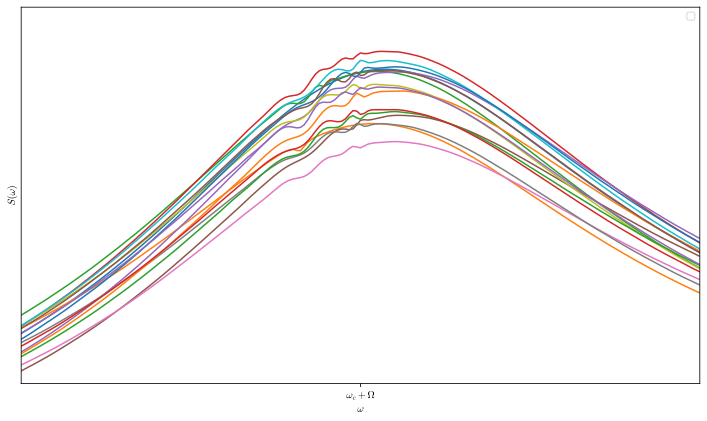

In [75]:
fig, ax = plot_emission_spectra([delta_Expt_t_taus_coh,
                                 Expt_t_taus_wp_fock[1/16,16][0],
                                 Expt_t_taus_wp_fock[2/16,16][0],
                                 Expt_t_taus_wp_fock[3/16,16][0],
                                 Expt_t_taus_wp_fock[4/16,16][0],
                                 Expt_t_taus_wp_fock[5/16,16][0],
                                 Expt_t_taus_wp_fock[6/16,16][0],
                                 Expt_t_taus_wp_fock[7/16,16][0],
                                 Expt_t_taus_wp_fock[8/16,16][0],
                                 Expt_t_taus_wp_fock[9/16,16][0],
                                 Expt_t_taus_wp_fock[10/16,16][0],
                                 Expt_t_taus_wp_fock[11/16,16][0],
                                 Expt_t_taus_wp_fock[12/16,16][0],
                                 Expt_t_taus_wp_fock[13/16,16][0],
                                 Expt_t_taus_wp_fock[14/16,16][0],
                                 Expt_t_taus_wp_fock[15/16,16][0]],
                                it.repeat(''),
                                Rabi_offset, width=width, figsize=(10, 6))
ax.set_xlim(width + Rabi_offset - 2*np.sqrt(width), width + Rabi_offset + 2*np.sqrt(width))
ax.set_ylim(ax.get_ylim()[1]/8, 3*ax.get_ylim()[1]/8)
plt.tight_layout()

In [76]:
def get_fluorescences(auto_corrs, T):
    width = 2*T
    d_omega = 2*np.pi / T
    frequencies = d_omega*(np.arange(2*width - 1) - width)
    fluorescences = []
    for auto_corr in auto_corrs:
        ywf = fft(auto_corr.real)
        fluorescences.append(np.abs(np.hstack([ywf[1-width:], ywf[:width]])))
    return frequencies, fluorescences

In [77]:
fock_freqs, fock_fluors = get_fluorescences([delta_Expt_t_taus_coh,
                                             Expt_t_taus_wp_fock[1/16,16][0],
                                             Expt_t_taus_wp_fock[2/16,16][0],
                                             Expt_t_taus_wp_fock[3/16,16][0],
                                             Expt_t_taus_wp_fock[4/16,16][0],
                                             Expt_t_taus_wp_fock[6/16,16][0],
                                             Expt_t_taus_wp_fock[7/16,16][0],
                                             Expt_t_taus_wp_fock[8/16,16][0],
                                             Expt_t_taus_wp_fock[9/16,16][0],
                                             Expt_t_taus_wp_fock[10/16,16][0],
                                             Expt_t_taus_wp_fock[11/16,16][0],
                                             Expt_t_taus_wp_fock[12/16,16][0],
                                             Expt_t_taus_wp_fock[13/16,16][0],
                                             Expt_t_taus_wp_fock[14/16,16][0],
                                             Expt_t_taus_wp_fock[15/16,16][0]], T)

In [78]:
fock_fluors[0].shape

In [79]:
Rabi_freq = 2*np.abs(beta)
Rabi_freq

In [80]:
N = len(fock_fluors) - 1
for n, fluor in enumerate(fock_fluors):
    plt.fill_between(fock_freqs + 0.2*n, fluor + N - n, color='w', zorder=n)
    plt.plot(fock_freqs + 0.2*n, fluor + N - n, color='k', linewidth=0.5, zorder=n)
plt.savefig('joy-mollow.png')

In [81]:
SINGLE_COL_WIDTH = 3.4039 #INCHES
DOUBLE_COL_WIDTH = 7.0569 #INCHES 

SMALL_SIZE = 6.5
MEDIUM_SIZE = 8.5
BIGGER_SIZE = 10.5

plt.rc('text', usetex=False)
plt.rc('font', size=SMALL_SIZE)          # controls default text sizes
plt.rc('axes', titlesize=SMALL_SIZE)     # fontsize of the axes title
plt.rc('axes', labelsize=MEDIUM_SIZE)    # fontsize of the x and y labels
plt.rc('xtick', labelsize=SMALL_SIZE)    # fontsize of the tick labels
plt.rc('ytick', labelsize=SMALL_SIZE)    # fontsize of the tick labels
plt.rc('legend', fontsize=SMALL_SIZE)    # legend fontsize
plt.rc('figure', titlesize=BIGGER_SIZE)  # fontsize of the figure title
plt.rc('lines',linewidth=0.75)

In [82]:
N = len(fock_fluors) - 1
fig, ax = plt.subplots(figsize=(SINGLE_COL_WIDTH, 2.5))
for n, fluor in enumerate(fock_fluors):
    ax.fill_between(fock_freqs + 0.2*n, fluor + N - n, color='w', zorder=n)
    ax.plot(fock_freqs + 0.2*n, fluor + N - n, color='k', linewidth=0.5, zorder=n)
plt.tight_layout()
plt.savefig('joy-mollow.pdf')
plt.show()

In [125]:
N = len(fock_fluors) - 1
fig, ax = plt.subplots(figsize=(SINGLE_COL_WIDTH, 2))
ax.set_frame_on(False)
ax.set_xticks([])
ax.set_yticks([])
for n, fluor in enumerate(fock_fluors):
    ax.fill_between(fock_freqs + 0.2*n, fluor + N - n, color='w', zorder=n)
    ax.plot(fock_freqs + 0.2*n, fluor + N - n, color='k', linewidth=0.5, zorder=n)
ax.arrow(15, 15, 0.2 * N, -N, width=0.01, head_width=0.5, color='k')
ax.arrow(15, 15, 0, 15, width=0.01, head_width=0.5, color='k')
ax.arrow(15, 15, 10, 0, width=0.01, head_width=0.5, color='k')
ax.annotate(s='$t$', xy=(20, 0), fontsize=12)
ax.annotate(s='$S(\\omega)$', xy=(16, 28), fontsize=12)
ax.annotate(s='$\\omega$', xy=(24, 17), fontsize=12)
ax.set_xlim(-15, 26)
plt.tight_layout()
plt.savefig('joy-mollow.pdf')
plt.show()

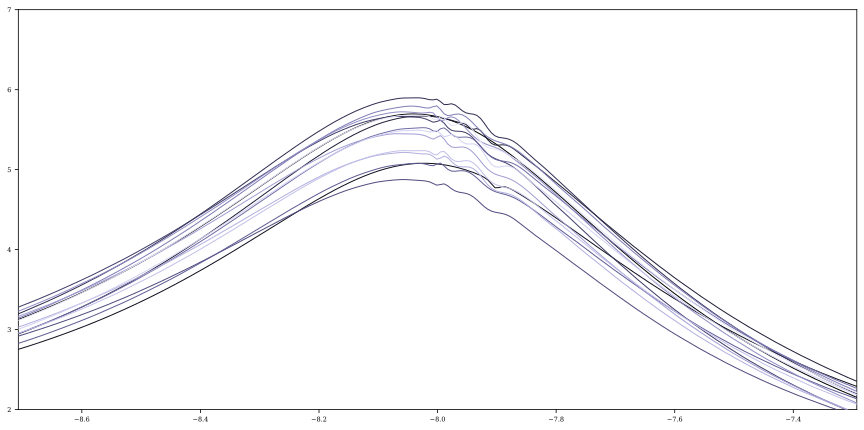

In [83]:
colors = sns.cubehelix_palette(n_colors=len(fock_fluors), start=0, dark=0, light=0.9, rot=0, reverse=True)
N = len(fock_fluors) - 1
fig, ax = plt.subplots(figsize=(12,6))
for n, (fluor, color) in enumerate(zip(fock_fluors, colors)):
    #plt.fill_between(fock_freqs, fluor + 0.5*(N - n), color='w', zorder=n)
    ax.plot(fock_freqs, fluor + 0.0*(N - n), color=color, linewidth=1, zorder=n)
ax.set_xlim(-Rabi_freq - 0.25*np.sqrt(Rabi_freq), -Rabi_freq + 0.25*np.sqrt(Rabi_freq))
ax.set_ylim(2, 7)
plt.tight_layout()
plt.savefig('joy-mollow-sideband.png')

In [84]:
N = len(fock_fluors) - 1
for n, fluor in enumerate(reversed(fock_fluors)):
    plt.fill_between(fock_freqs, fluor + 0.5*(N - n), color='w', zorder=n)
    plt.plot(fock_freqs, fluor + 0.5*(N - n), color='k', linewidth=0.5, zorder=n)
plt.xlim(-Rabi_freq - 0.25*np.sqrt(Rabi_freq), -Rabi_freq + 0.25*np.sqrt(Rabi_freq))
plt.ylim(3, 13)
plt.savefig('joy-mollow-sideband-reversed.png')

In [85]:
20*np.log10(np.exp(r))

In [86]:
r = np.log(2)
mu = 0
Expt_t_taus_wp_fock = {}
t_final = 1
m_max = 12
Expt_t_taus_wp_fock[t_final,m_max] = gen_save_load_data(partial(gen_Expt_t_taus_wavepacket_fock, L=L, r=r, mu=mu, beta=beta,
                                                                gamma=gamma, m_max=m_max, taus=taus, rho_ss_coh=rho_ss_coh,
                                                                t_final=t_final, solve_ivp_kwargs={'rtol': 1e-6, 'atol': 1e-9}),
                                                        'test_expt_t_taus_wp_fock.pickle'.format(t_final, m_max))

Data already exist.


EOFError: Ran out of input

In [ ]:
r = np.log(2)
mu = np.pi / 2
Expt_t_taus_wp_fock = {}
t_final = 1
m_max = 12
Expt_t_taus_wp_fock[t_final,m_max] = gen_save_load_data(partial(gen_Expt_t_taus_wavepacket_fock, L=L, r=r, mu=mu, beta=beta,
                                                                gamma=gamma, m_max=m_max, taus=taus, rho_ss_coh=rho_ss_coh,
                                                                t_final=t_final, solve_ivp_kwargs={'rtol': 1e-6, 'atol': 1e-9}),
                                                        'test_expt_t_taus_wp_fock_mu_pi_2.pickle'.format(t_final, m_max))

In [ ]:
def gen_Expt_t_taus_wavepacket_fock(L, r, mu, beta, gamma, m_max, taus, rho_ss_coh, t_final, solve_ivp_kwargs=None):
    return calc_hier_auto_corr_fock(lambda t: xi_rect(t, 0, 2)*np.exp(2.j*np.abs(beta)*t),
                                    L, r, mu, beta, gamma, m_max,
                                    taus, rho_ss_coh, t=t_final,
                                    solve_ivp_kwargs=solve_ivp_kwargs)

In [ ]:
def get_quasi_fluors(
        T, gamma, Omega, omega_A, omega_L, gamma_c, eps, phi_L, phi_s, times_ss, taus, solve_ivp_kwargs=None):
    _, Expt_t_taus = calc_quasi_markoff_degen_PA_auto_corr(gamma, Omega, omega_A, omega_L, gamma_c, eps, phi_L, phi_s, times_ss, taus, solve_ivp_kwargs)
    fluors = get_fluorescences([Expt_t_taus], T)[1]
    return fluors

In [ ]:
Omega = 2*np.abs(beta)
phi_L = np.angle(beta)
omega_A = 0
omega_L = 0
gamma_c = 1
eps = 0.5
phi_s = 0
quasi_fluor = get_quasi_fluors(T, gamma, Omega, omega_A, omega_L, gamma_c, eps, phi_L, phi_s, times_ss, taus)[0]

In [ ]:
plt.plot(quasi_fluor)
plt.plot(fock_fluors[0])

In [ ]:
def get_quasi_cost_fn(target_fluor, T, gamma, beta, omega_A, omega_L, times_ss, taus, solve_ivp_kwargs=None):
    Omega = 2*np.abs(beta)
    phi_L = np.angle(beta)
    def calculate_cost(x):
        gamma_c, eps, phi_s = x
        quasi_fluor = get_quasi_fluors(T, gamma, Omega, omega_A, omega_L, gamma_c, eps, phi_L, phi_s, times_ss, taus)[0]
        return np.sum((quasi_fluor - target_fluor)**2)
    return calculate_cost

In [ ]:
omega_A = 0
omega_L = 0
quasi_cost_fn = get_quasi_cost_fn(fock_fluors[0], T, gamma, beta, omega_A, omega_L, times_ss, taus)

In [ ]:
%%time
gamma_c = 1
eps = 0.5
phi_s = 0
quasi_soln = minimize(quasi_cost_fn, x0=np.array([gamma_c, eps, phi_s]))

In [ ]:
quasi_soln

In [ ]:
%%time
gamma_c = 1
eps = 0.5
phi_s = 0
quasi_soln2 = minimize(quasi_cost_fn, x0=np.array([gamma_c, eps, phi_s]), method='Nelder-Mead')

In [ ]:
quasi_soln2

In [ ]:
quasi_soln2_fluor = get_quasi_fluors(T, gamma, Omega, omega_A, omega_L, quasi_soln2.x[0], quasi_soln2.x[1], phi_L, quasi_soln2.x[2], times_ss, taus)

In [ ]:
coh_fluor = get_fluorescences([delta_Expt_t_taus_coh], T)[1][0]

In [ ]:
fig, axs = plt.subplots(ncols=5, sharey=True, figsize=(15,3))
axs[0].plot(quasi_fluor)
axs[1].plot(fock_fluors[0])
axs[2].plot(fock_fluors[1])
axs[3].plot(coh_fluor)
axs[4].plot(quasi_soln2_fluor[0])

In [ ]:
omega_A = 0
omega_L = 0
quasi_cost_fn1 = get_quasi_cost_fn(fock_fluors[1], T, gamma, beta, omega_A, omega_L, times_ss, taus)

In [ ]:
%%time
gamma_c = 1
eps = 0.5
phi_s = 0
quasi_soln3 = minimize(quasi_cost_fn1, x0=np.array([gamma_c, eps, phi_s]), method='Nelder-Mead')

In [ ]:
quasi_soln3

In [ ]:
quasi_soln3_fluor = get_quasi_fluors(T, gamma, Omega, omega_A, omega_L, quasi_soln3.x[0], quasi_soln3.x[1], phi_L, quasi_soln3.x[2], times_ss, taus)

In [ ]:
fig, axs = plt.subplots(ncols=3, sharey=True, figsize=(9,3))
axs[0].plot(coh_fluor)
axs[1].plot(fock_fluors[1])
axs[2].plot(quasi_soln3_fluor[0])